In [1]:
# system libraries
import os
import warnings
warnings.filterwarnings("ignore")
from time import time
import gc

# data structure libraries
import numpy as np
import pandas as pd

# data visualisation libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.transform import resize
from IPython.display import SVG
import seaborn as sns

# deep learning libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Sequential
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.data import experimental
from tensorflow.keras.utils import plot_model, model_to_dot

Le but de ce projet est de réaliser un classificateur de races canines. Ce projet comporte deux volets principaux. Dans un premier temps, la construction du modèle a été réalisée sur un petit sous-échantillon de races. Après la sélection du modèle, toutes les races sont incluses afin de créer notre application.

La construction et la sélection du modèle seront également séparées en deux parties. Dans une première partie, nous explorons CNN à partir de zéro et les effets du prétraitement et de l'augmentation des données sur
Essai avec huit races de chiens - Pas de prétraitement + Convnet

Afin de développer notre système de vision par ordinateur, huit races de chiens ont été choisies. Ce choix était là pour simplifier l'apprentissage des différents modèles et la compréhension des différentes étapes.

In [2]:
path = 'C:/Users/dupon/OneDrive/Bureau/OCR/Machine Learning/Projet 6/selection/'
img_width, img_height = 224, 224
channels = 3
batch_size = 32
image_arr_size= img_width * img_height * channels


1) Data preparation

À l'aide des fonctions Tensorflow, un train et un ensemble de validation ont été créés. Les caractéristiques des images ont été définies comme suit :

    Width: 224,
    Height: 224,
    Channels: 3,

Chaque paramètre a été enregistré dans des variables afin d'aider à la réplicabilité de nos méthodes.

In [3]:
# Creating a train set
train_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="training",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 1375 files belonging to 8 classes.
Using 1100 files for training.


In [4]:
# Creating a validation set
val_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 1375 files belonging to 8 classes.
Using 275 files for validation.


In [5]:
# Displaying names of breed
class_names = train_set.class_names
print(class_names)

['n02088238-basset', 'n02099712-Labrador_retriever', 'n02105162-malinois', 'n02106166-Border_collie', 'n02106662-German_shepherd', 'n02108915-French_bulldog', 'n02110958-pug', 'n02111889-Samoyed']


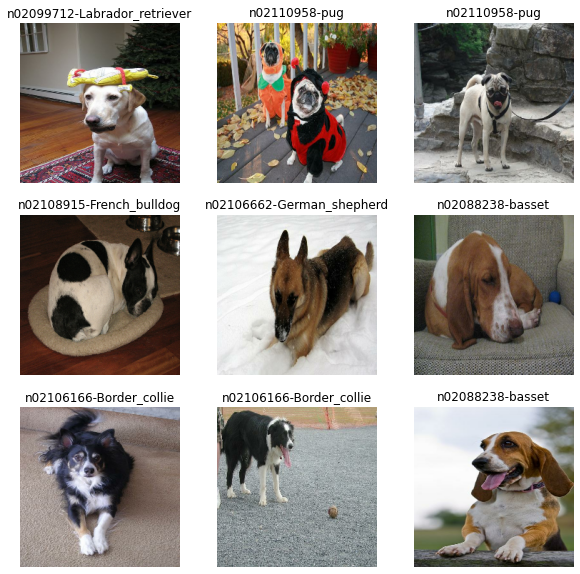

In [6]:
# Displaying some pictures of train set
plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [7]:
for image_batch, labels_batch in train_set:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 224, 224, 3)
(32,)


2 datasets ont été crées avec nos 8 races différentes, le data d'entrainement avec 80% de nos données et le dataset de validation avec les 20% restant.

In [8]:
num_classes = 120

# Architecture of our CNN
model = keras.Sequential()
model.add(keras.Input(shape=(img_height, img_width, channels)))
model.add(layers.Rescaling(1./255))
model.add(layers.Conv2D(128, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(64, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(32, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(num_classes, activation="softmax"))

model.compile(
  optimizer='adam', 
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [9]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 128)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      73792     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 32)        1

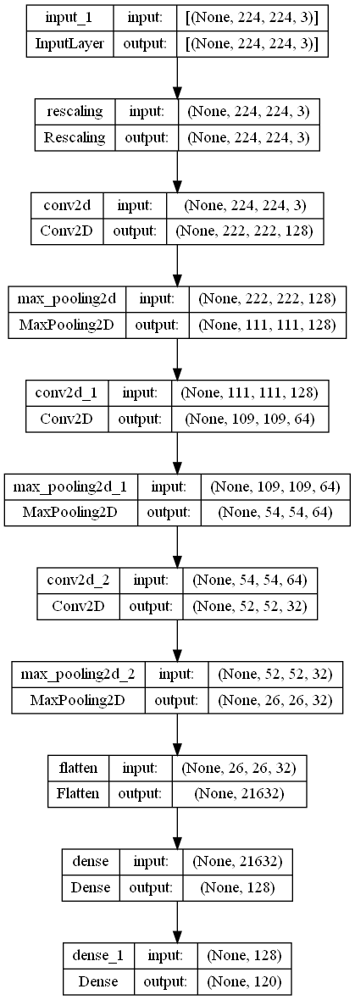

In [10]:
from keras.utils import plot_model
os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin/'

#tensorflow.keras.utils.vis_utils.pydot = pydotplus
# Displaying model
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

Notre modèle contient une couche de mise à l'échelle. Cette couche est là pour transformer la valeur du pixel en une valeur entre [0, 1]. Trois couches convolutionnelles et trois couches de regroupement sont présentées afin de sélectionner les informations pertinentes dans chaque image. Enfin, des couches aplaties et entièrement connectées sont utilisées afin de transformer le résultat en une prédiction. Cette prédiction est une probabilité d'appartenir à une classe.

In [11]:
t0 = time()

epochs = 20

# training model + time measure
history = model.fit(train_set, validation_data=val_set, epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
35/35 [==============================] - 93s 3s/step - loss: 2.5310 - accuracy: 0.1518 - val_loss: 2.1822 - val_accuracy: 0.1455
Epoch 2/20
35/35 [==============================] - 94s 3s/step - loss: 2.0787 - accuracy: 0.1882 - val_loss: 2.0335 - val_accuracy: 0.1964
Epoch 3/20
35/35 [==============================] - 97s 3s/step - loss: 1.8905 - accuracy: 0.2918 - val_loss: 1.9480 - val_accuracy: 0.2691
Epoch 4/20
35/35 [==============================] - 98s 3s/step - loss: 1.6134 - accuracy: 0.4091 - val_loss: 1.9289 - val_accuracy: 0.3455
Epoch 5/20
35/35 [==============================] - 100s 3s/step - loss: 1.3001 - accuracy: 0.5427 - val_loss: 2.0869 - val_accuracy: 0.3055
Epoch 6/20
35/35 [==============================] - 96s 3s/step - loss: 0.8134 - accuracy: 0.7364 - val_loss: 2.7934 - val_accuracy: 0.2727
Epoch 7/20
35/35 [==============================] - 94s 3s/step - loss: 0.4306 - accuracy: 0.8700 - val_loss: 3.5394 - val_accuracy: 0.3018
Epoch 8/20
35/35 [=

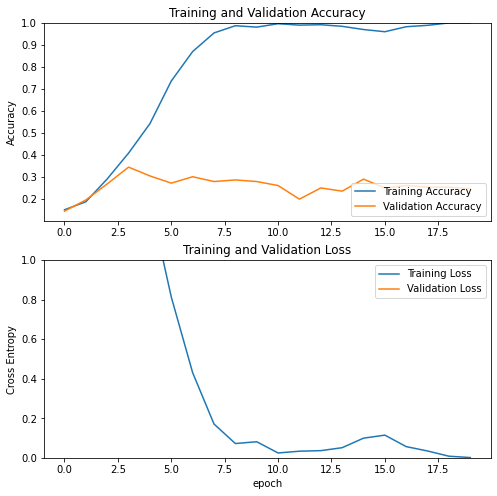

In [12]:
# Accuracy and Loss graphical representation
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Ce premier essai montre qu'un CNN a réalisé des performances médiocres. Ce CNN est speed (1'30" pour l'entraînement) mais on constate un surajustement. Afin d'améliorer nos performances, un deuxième essai sera réalisé avec des prétraitements de nos images.

In [13]:
del train_set
del val_set
del model
del history

gc.collect()

19879

Essai avec huit races - Prétraitement des images + Convnet
1) Prétraitement des images

Avant de modéliser et d'utiliser un nouveau CNN, les données seront prétraitées. Certaines méthodes seront utilisées. Parmi eux, le blanchiment ou la rotation seront tentés. Cette étape a deux objectifs :

    Meilleures performances avec la structure CNN ;
    Augmentation des données.

In [14]:
img_gen = ImageDataGenerator(rescale=1./255,
                             zca_whitening=True,
                             horizontal_flip=True,
                             vertical_flip=True,
                             validation_split=0.2)#,
                             #dtype=tf.float32)

In [15]:
train_generator = img_gen.flow_from_directory(
    path,
    subset="training",
    seed=42,
    class_mode='sparse',
    target_size=(img_height, img_width), 
    color_mode='rgb',
    batch_size=batch_size)

Found 1102 images belonging to 8 classes.


In [16]:
validation_generator = img_gen.flow_from_directory(
    path,
    subset="validation",
    seed=42,
    class_mode='sparse',
    target_size=(img_height, img_width), 
    color_mode='rgb',
    batch_size=batch_size)

Found 273 images belonging to 8 classes.


2) Convnet modelisation

L'architecture de notre CNN est la même que celle du premier essai. Les données d'entrée sont différentes en raison du prétraitement et de l'augmentation des données.


In [17]:
num_classes = 8

# Architecture of our CNN
model = keras.Sequential()
model.add(keras.Input(shape=(img_height, img_width, channels)))
model.add(layers.Conv2D(128, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(64, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(32, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(num_classes, activation="softmax"))

model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [18]:
t0 = time()

epochs = 20

# training model+ time measurement

history = model.fit_generator(
  train_generator,
  steps_per_epoch = train_generator.samples // batch_size,
  validation_data = validation_generator, 
  validation_steps = validation_generator.samples // batch_size,
  epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
34/34 [==============================] - 89s 3s/step - loss: 2.0947 - accuracy: 0.1607 - val_loss: 2.0578 - val_accuracy: 0.1562
Epoch 2/20
34/34 [==============================] - 91s 3s/step - loss: 2.0203 - accuracy: 0.2019 - val_loss: 1.9907 - val_accuracy: 0.2188
Epoch 3/20
34/34 [==============================] - 92s 3s/step - loss: 1.9498 - accuracy: 0.2280 - val_loss: 1.8872 - val_accuracy: 0.2773
Epoch 4/20
34/34 [==============================] - 89s 3s/step - loss: 1.8471 - accuracy: 0.3037 - val_loss: 1.9436 - val_accuracy: 0.2578
Epoch 5/20
34/34 [==============================] - 93s 3s/step - loss: 1.7718 - accuracy: 0.3467 - val_loss: 1.9119 - val_accuracy: 0.2812
Epoch 6/20
34/34 [==============================] - 96s 3s/step - loss: 1.6963 - accuracy: 0.3813 - val_loss: 1.8936 - val_accuracy: 0.2930
Epoch 7/20
34/34 [==============================] - 93s 3s/step - loss: 1.5649 - accuracy: 0.4467 - val_loss: 1.8915 - val_accuracy: 0.3164
Epoch 8/20
34/34 [==

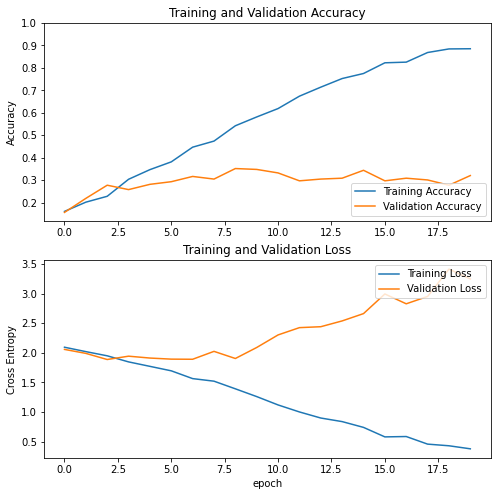

In [19]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([min(plt.ylim()),max(plt.ylim())])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [20]:
del validation_generator
del train_generator
del model
del history
del img_gen

gc.collect()

18157

Les performances sont nettement meilleures et le temps consacré à l'entraînement est moins important. Cependant, certains modèles pré-formés peuvent nous aider à avoir de meilleures performances. Dans une deuxième approche, nous utiliserons des méthodes d'apprentissage par transfert.
Apprentissage par transfert

Comme vu précédemment, le prétraitement et la préparation des données améliorent la précision de nos modèles.
1) Préparation des données

## Data preparation

In [21]:
# Creating train set

train_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="training",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 1375 files belonging to 8 classes.
Using 1100 files for training.


In [22]:
# Creating validation set

val_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 1375 files belonging to 8 classes.
Using 275 files for validation.


In [23]:
# Creating test set

val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [24]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

Number of validation batches: 8
Number of test batches: 1


In [25]:
AUTOTUNE = tf.data.AUTOTUNE

train_set = train_set.prefetch(buffer_size=AUTOTUNE)
val_set = val_set.prefetch(buffer_size=AUTOTUNE)
test_set = test_set.prefetch(buffer_size=AUTOTUNE)

In [26]:
# data augmentation layer

data_augmentation = tf.keras.Sequential([
  layers.RandomFlip('horizontal_and_vertical', seed=42),
  layers.RandomRotation(0.2)
])

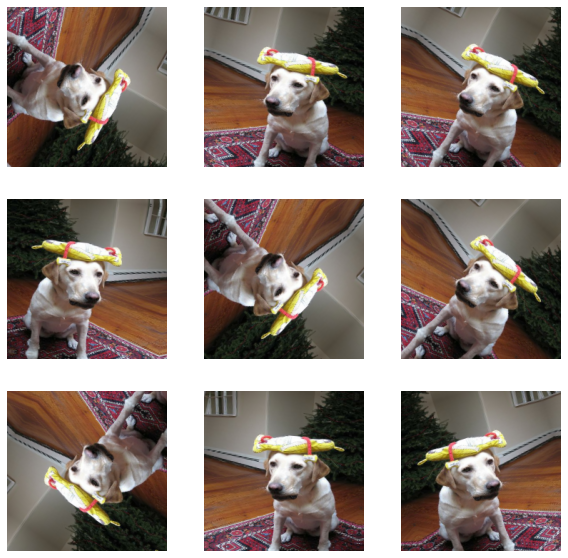

In [27]:
for image, _ in train_set.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

### Transfert learning VGG19

Le Vgg19 est une variante du vgg16, il contient 19 couches

In [28]:
img_shape = img_height, img_width, channels

In [29]:
num_classes = 8

In [30]:
preprocess_input = keras.applications.vgg19.preprocess_input
rescale = layers.Rescaling(1./255, offset=-1)

In [31]:
base_model = keras.applications.vgg19.VGG19(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

In [32]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)

In [33]:
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [34]:
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 8)


In [35]:
# Freezing 11 layers and training 8
for layer in base_model.layers[:8]:
  base_model.trainable = False

In [36]:
base_model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

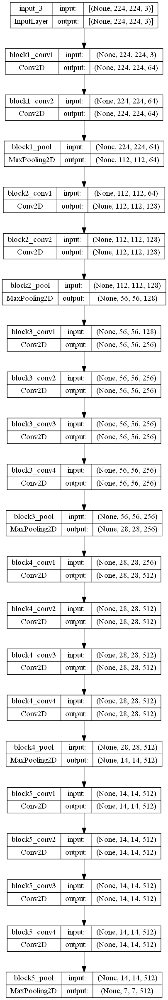

In [37]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
tf.keras.utils.plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [38]:
# Architecture of VGG19 with input layers, data augmentation and preprocessing layers

inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [39]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [40]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                      

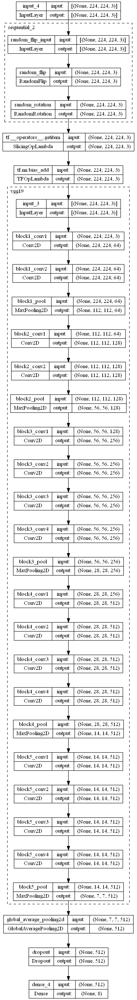

In [41]:
SVG(model_to_dot(model).create(prog='dot', format='svg'))
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [42]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
35/35 [==============================] - 146s 4s/step - loss: 6.7147 - accuracy: 0.2136 - val_loss: 3.6514 - val_accuracy: 0.5062
Epoch 2/20
35/35 [==============================] - 151s 4s/step - loss: 3.6747 - accuracy: 0.4018 - val_loss: 1.8226 - val_accuracy: 0.6955
Epoch 3/20
35/35 [==============================] - 150s 4s/step - loss: 2.7127 - accuracy: 0.4973 - val_loss: 1.2159 - val_accuracy: 0.7613
Epoch 4/20
35/35 [==============================] - 152s 4s/step - loss: 2.3253 - accuracy: 0.5509 - val_loss: 0.9137 - val_accuracy: 0.8107
Epoch 5/20
35/35 [==============================] - 145s 4s/step - loss: 2.0399 - accuracy: 0.6064 - val_loss: 0.8368 - val_accuracy: 0.8272
Epoch 6/20
35/35 [==============================] - 157s 4s/step - loss: 1.6503 - accuracy: 0.6473 - val_loss: 0.6705 - val_accuracy: 0.8724
Epoch 7/20
35/35 [==============================] - 210s 6s/step - loss: 1.4497 - accuracy: 0.6709 - val_loss: 0.7174 - val_accuracy: 0.8765
Epoch 8/20
35

In [43]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

8/8 [==============================] - 33s 4s/step - loss: 0.5369 - accuracy: 0.8930
initial loss: 0.54
initial accuracy: 0.89


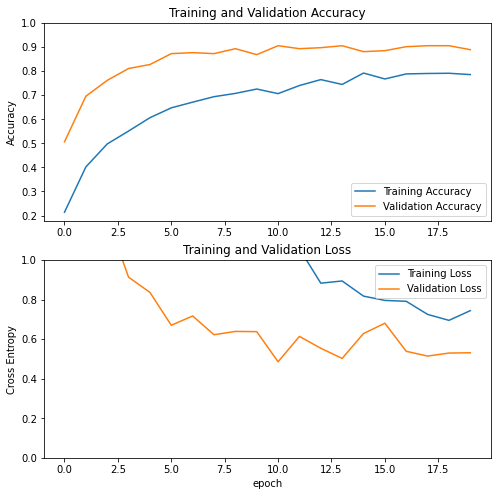

In [44]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Les performances sont meilleures avec VGG19 qu'avec CNN from scratch et le temps d'entraînement est moins important. La deuxième étape consiste à peaufiner notre modèle.

In [45]:
base_model.trainable = True

In [46]:
# Fine-tune from this layer onwards
fine_tune_at = 5

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [47]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)

print("Done in %0.3fs." % (time() - t0))

Epoch 20/40
35/35 [==============================] - 254s 7s/step - loss: 0.6936 - accuracy: 0.8036 - val_loss: 0.5001 - val_accuracy: 0.9053
Epoch 21/40
35/35 [==============================] - 266s 8s/step - loss: 0.7351 - accuracy: 0.8018 - val_loss: 0.5428 - val_accuracy: 0.8930
Epoch 22/40
35/35 [==============================] - 285s 8s/step - loss: 0.6053 - accuracy: 0.8164 - val_loss: 0.4195 - val_accuracy: 0.9095
Epoch 23/40
35/35 [==============================] - 287s 8s/step - loss: 0.5888 - accuracy: 0.8127 - val_loss: 0.5565 - val_accuracy: 0.8930
Epoch 24/40
35/35 [==============================] - 280s 8s/step - loss: 0.5592 - accuracy: 0.8145 - val_loss: 0.5436 - val_accuracy: 0.9053
Epoch 25/40
35/35 [==============================] - 284s 8s/step - loss: 0.5711 - accuracy: 0.8400 - val_loss: 0.5494 - val_accuracy: 0.9012
Epoch 26/40
35/35 [==============================] - 269s 8s/step - loss: 0.5584 - accuracy: 0.8400 - val_loss: 0.5059 - val_accuracy: 0.8930
Epoch 

In [48]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

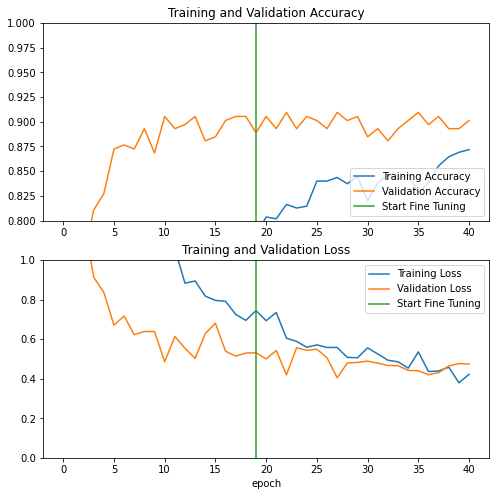

In [49]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [50]:
loss, accuracy = model.evaluate(test_set)
print('Test accuracy :', accuracy)

1/1 [==============================] - 6s 6s/step - loss: 0.8133 - accuracy: 0.8125
Test accuracy : 0.8125


In [51]:
del model
del base_model
del history
del loss0, accuracy0
del accuracy
del rescale
del test_set

gc.collect()

13984

In [52]:
rescale = layers.Rescaling(1./255, offset=-1)
preprocess_input = keras.applications.resnet_v2.preprocess_input
base_model = keras.applications.resnet_v2.ResNet50V2(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

In [53]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)

In [54]:
val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [55]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

Number of validation batches: 7
Number of test batches: 1


In [56]:
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 2048)


In [57]:
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 8)


In [58]:
for layer in base_model.layers[:8]:
  base_model.trainable = False

In [59]:
base_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                         

                                                                                                  
 conv2_block3_preact_relu (Acti  (None, 56, 56, 256)  0          ['conv2_block3_preact_bn[0][0]'] 
 vation)                                                                                          
                                                                                                  
 conv2_block3_1_conv (Conv2D)   (None, 56, 56, 64)   16384       ['conv2_block3_preact_relu[0][0]'
                                                                 ]                                
                                                                                                  
 conv2_block3_1_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_blo

 conv3_block2_2_conv (Conv2D)   (None, 28, 28, 128)  147456      ['conv3_block2_2_pad[0][0]']     
                                                                                                  
 conv3_block2_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block2_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block2_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block2_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block2_3_conv (Conv2D)   (None, 28, 28, 512)  66048       ['conv3_block2_2_relu[0][0]']    
                                                                                                  
 conv3_blo

 conv4_block1_1_conv (Conv2D)   (None, 14, 14, 256)  131072      ['conv4_block1_preact_relu[0][0]'
                                                                 ]                                
                                                                                                  
 conv4_block1_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block1_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block1_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block1_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block1_2_pad (ZeroPaddin  (None, 16, 16, 256)  0          ['conv4_block1_1_relu[0][0]']    
 g2D)     

                                                                                                  
 conv4_block3_2_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block3_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block3_3_conv (Conv2D)   (None, 14, 14, 1024  263168      ['conv4_block3_2_relu[0][0]']    
                                )                                                                 
                                                                                                  
 conv4_block3_out (Add)         (None, 14, 14, 1024  0           ['conv4_block2_out[0][0]',       
                                )                                 'conv4_block3_3_conv[0][0]']    
                                                                                                  
 conv4_blo

 conv4_block6_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block6_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block6_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block6_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block6_2_pad (ZeroPaddin  (None, 16, 16, 256)  0          ['conv4_block6_1_relu[0][0]']    
 g2D)                                                                                             
                                                                                                  
 conv4_block6_2_conv (Conv2D)   (None, 7, 7, 256)    589824      ['conv4_block6_2_pad[0][0]']     
          

                                                                                                  
 conv5_block2_3_conv (Conv2D)   (None, 7, 7, 2048)   1050624     ['conv5_block2_2_relu[0][0]']    
                                                                                                  
 conv5_block2_out (Add)         (None, 7, 7, 2048)   0           ['conv5_block1_out[0][0]',       
                                                                  'conv5_block2_3_conv[0][0]']    
                                                                                                  
 conv5_block3_preact_bn (BatchN  (None, 7, 7, 2048)  8192        ['conv5_block2_out[0][0]']       
 ormalization)                                                                                    
                                                                                                  
 conv5_block3_preact_relu (Acti  (None, 7, 7, 2048)  0           ['conv5_block3_preact_bn[0][0]'] 
 vation)  

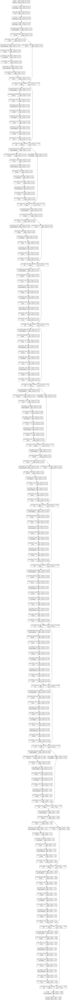

In [60]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [61]:
inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.7)(x)
x = layers.Flatten()(x) 
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [62]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [63]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0   

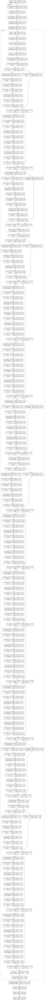

In [64]:
SVG(model_to_dot(model).create(prog='dot', format='svg'))
plot_model(model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [65]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)


print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
35/35 [==============================] - 57s 2s/step - loss: 2.9659 - accuracy: 0.2655 - val_loss: 0.4989 - val_accuracy: 0.8436
Epoch 2/20
35/35 [==============================] - 55s 2s/step - loss: 1.7044 - accuracy: 0.5073 - val_loss: 0.2842 - val_accuracy: 0.9194
Epoch 3/20
35/35 [==============================] - 61s 2s/step - loss: 1.2163 - accuracy: 0.6345 - val_loss: 0.2324 - val_accuracy: 0.9194
Epoch 4/20
35/35 [==============================] - 75s 2s/step - loss: 1.0915 - accuracy: 0.6673 - val_loss: 0.1960 - val_accuracy: 0.9384
Epoch 5/20
35/35 [==============================] - 77s 2s/step - loss: 0.9525 - accuracy: 0.7127 - val_loss: 0.2013 - val_accuracy: 0.9336
Epoch 6/20
35/35 [==============================] - 63s 2s/step - loss: 0.8460 - accuracy: 0.7355 - val_loss: 0.1759 - val_accuracy: 0.9431
Epoch 7/20
35/35 [==============================] - 58s 2s/step - loss: 0.8374 - accuracy: 0.7373 - val_loss: 0.1591 - val_accuracy: 0.9526
Epoch 8/20
35/35 [==

In [66]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

7/7 [==============================] - 9s 1s/step - loss: 0.1783 - accuracy: 0.9431
initial loss: 0.18
initial accuracy: 0.94


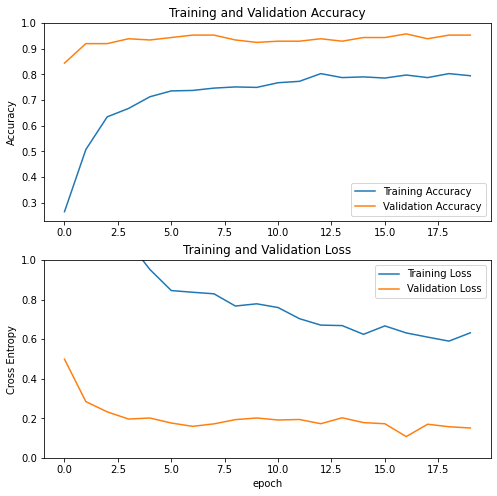

In [67]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()



In [68]:
base_model.trainable = True

In [69]:
# Fine-tune from this layer onwards
fine_tune_at = 5

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [70]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)


print("Done in %0.3fs." % (time() - t0))

Epoch 20/40
35/35 [==============================] - 60s 2s/step - loss: 0.6236 - accuracy: 0.8055 - val_loss: 0.1734 - val_accuracy: 0.9431
Epoch 21/40
35/35 [==============================] - 60s 2s/step - loss: 0.5644 - accuracy: 0.7982 - val_loss: 0.1995 - val_accuracy: 0.9431
Epoch 22/40
35/35 [==============================] - 59s 2s/step - loss: 0.5996 - accuracy: 0.8082 - val_loss: 0.2014 - val_accuracy: 0.9242
Epoch 23/40
35/35 [==============================] - 59s 2s/step - loss: 0.5749 - accuracy: 0.8118 - val_loss: 0.2104 - val_accuracy: 0.9242
Epoch 24/40
35/35 [==============================] - 62s 2s/step - loss: 0.5892 - accuracy: 0.8127 - val_loss: 0.2024 - val_accuracy: 0.9147
Epoch 25/40
35/35 [==============================] - 61s 2s/step - loss: 0.5472 - accuracy: 0.8209 - val_loss: 0.1653 - val_accuracy: 0.9336
Epoch 26/40
35/35 [==============================] - 62s 2s/step - loss: 0.6003 - accuracy: 0.7936 - val_loss: 0.1784 - val_accuracy: 0.9289
Epoch 27/40
3

In [71]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

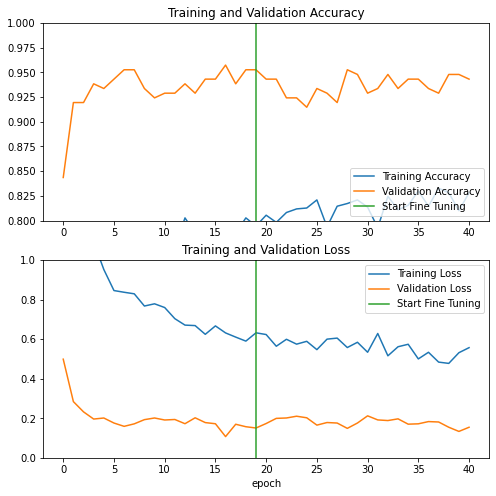

In [72]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [73]:
loss, accuracy = model.evaluate(test_set)
print('Test accuracy :', accuracy)

1/1 [==============================] - 2s 2s/step - loss: 0.2489 - accuracy: 0.8750
Test accuracy : 0.875


In [74]:
del model
del base_model
del history
del loss0, accuracy0
del accuracy

gc.collect()

39461


4) Inception V3

Third model is Inception V3. It is a model with more than 300 layers. We can expect best performance for this model.
Implementation

In [75]:
rescale = layers.Rescaling(1./255, offset=-1)
preprocess_input = keras.applications.inception_v3.preprocess_input
base_model = keras.applications.inception_v3.InceptionV3(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

In [76]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)

In [77]:
val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [78]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

Number of validation batches: 6
Number of test batches: 1


In [79]:
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 2048)


In [80]:
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 8)


In [81]:
for layer in base_model.layers[:10]:
  base_model.trainable = False

In [82]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 111, 111, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d_6[0][0]']               
 alization)                     )                                                      

                                                                                                  
 batch_normalization_5 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_11[0][0]']              
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_13[0][0]']              
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 25, 25, 96)  288         ['conv2d_16[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_nor

 conv2d_28 (Conv2D)             (None, 25, 25, 64)   18432       ['mixed1[0][0]']                 
                                                                                                  
 batch_normalization_22 (BatchN  (None, 25, 25, 64)  192         ['conv2d_28[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_22 (Activation)     (None, 25, 25, 64)   0           ['batch_normalization_22[0][0]'] 
                                                                                                  
 conv2d_26 (Conv2D)             (None, 25, 25, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_29 (Conv2D)             (None, 25, 25, 96)   55296       ['activation_22[0][0]']          
          

 activation_29 (Activation)     (None, 12, 12, 96)   0           ['batch_normalization_29[0][0]'] 
                                                                                                  
 max_pooling2d_11 (MaxPooling2D  (None, 12, 12, 288)  0          ['mixed2[0][0]']                 
 )                                                                                                
                                                                                                  
 mixed3 (Concatenate)           (None, 12, 12, 768)  0           ['activation_26[0][0]',          
                                                                  'activation_29[0][0]',          
                                                                  'max_pooling2d_11[0][0]']       
                                                                                                  
 conv2d_40 (Conv2D)             (None, 12, 12, 128)  98304       ['mixed3[0][0]']                 
          

                                                                  'activation_33[0][0]',          
                                                                  'activation_38[0][0]',          
                                                                  'activation_39[0][0]']          
                                                                                                  
 conv2d_50 (Conv2D)             (None, 12, 12, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_44 (BatchN  (None, 12, 12, 160)  480        ['conv2d_50[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_44 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_44[0][0]'] 
          

                                                                                                  
 batch_normalization_54 (BatchN  (None, 12, 12, 160)  480        ['conv2d_60[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_54 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_54[0][0]'] 
                                                                                                  
 conv2d_61 (Conv2D)             (None, 12, 12, 160)  179200      ['activation_54[0][0]']          
                                                                                                  
 batch_normalization_55 (BatchN  (None, 12, 12, 160)  480        ['conv2d_61[0][0]']              
 ormalization)                                                                                    
          

                                                                                                  
 conv2d_71 (Conv2D)             (None, 12, 12, 192)  258048      ['activation_64[0][0]']          
                                                                                                  
 batch_normalization_65 (BatchN  (None, 12, 12, 192)  576        ['conv2d_71[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_65 (Activation)     (None, 12, 12, 192)  0           ['batch_normalization_65[0][0]'] 
                                                                                                  
 conv2d_67 (Conv2D)             (None, 12, 12, 192)  147456      ['mixed6[0][0]']                 
                                                                                                  
 conv2d_72

                                                                                                  
 activation_73 (Activation)     (None, 12, 12, 192)  0           ['batch_normalization_73[0][0]'] 
                                                                                                  
 conv2d_76 (Conv2D)             (None, 12, 12, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_80 (Conv2D)             (None, 12, 12, 192)  258048      ['activation_73[0][0]']          
                                                                                                  
 batch_normalization_70 (BatchN  (None, 12, 12, 192)  576        ['conv2d_76[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_nor

                                                                                                  
 conv2d_90 (Conv2D)             (None, 5, 5, 192)    245760      ['average_pooling2d_7[0][0]']    
                                                                                                  
 batch_normalization_76 (BatchN  (None, 5, 5, 320)   960         ['conv2d_82[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_78 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_78[0][0]'] 
                                                                                                  
 activation_79 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_79[0][0]'] 
                                                                                                  
 activatio

 activation_87 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_87[0][0]'] 
                                                                                                  
 activation_88 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_88[0][0]'] 
                                                                                                  
 activation_91 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_91[0][0]'] 
                                                                                                  
 activation_92 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_92[0][0]'] 
                                                                                                  
 batch_normalization_93 (BatchN  (None, 5, 5, 192)   576         ['conv2d_99[0][0]']              
 ormalization)                                                                                    
          

In [83]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [84]:
inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.7)(x)
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [85]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [86]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
35/35 [==============================] - 43s 1s/step - loss: 2.3589 - accuracy: 0.3555 - val_loss: 0.2936 - val_accuracy: 0.9441
Epoch 2/20
35/35 [==============================] - 41s 1s/step - loss: 1.3183 - accuracy: 0.5982 - val_loss: 0.1589 - val_accuracy: 0.9553
Epoch 3/20
35/35 [==============================] - 37s 1s/step - loss: 0.9759 - accuracy: 0.6836 - val_loss: 0.1205 - val_accuracy: 0.9665
Epoch 4/20
35/35 [==============================] - 39s 1s/step - loss: 0.9085 - accuracy: 0.7236 - val_loss: 0.1002 - val_accuracy: 0.9665
Epoch 5/20
35/35 [==============================] - 39s 1s/step - loss: 0.8279 - accuracy: 0.7491 - val_loss: 0.0905 - val_accuracy: 0.9721
Epoch 6/20
35/35 [==============================] - 38s 1s/step - loss: 0.8957 - accuracy: 0.7373 - val_loss: 0.0734 - val_accuracy: 0.9777
Epoch 7/20
35/35 [==============================] - 38s 1s/step - loss: 0.7868 - accuracy: 0.7545 - val_loss: 0.1069 - val_accuracy: 0.9665
Epoch 8/20
35/35 [==

In [87]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

6/6 [==============================] - 7s 1s/step - loss: 0.0895 - accuracy: 0.9721
initial loss: 0.09
initial accuracy: 0.97


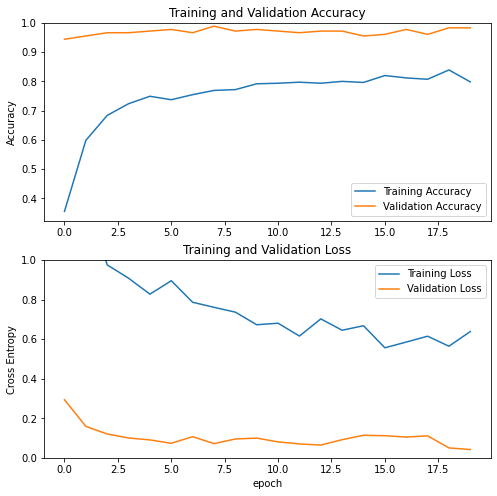

In [88]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Fine tuning

In [89]:
base_model.trainable = True

In [90]:
# Fine-tune from this layer onwards
fine_tune_at = 10

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [91]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)

print("Done in %0.3fs." % (time() - t0))

Epoch 20/40
35/35 [==============================] - 57s 2s/step - loss: 0.6104 - accuracy: 0.8136 - val_loss: 0.1143 - val_accuracy: 0.9665
Epoch 21/40
35/35 [==============================] - 54s 2s/step - loss: 0.6008 - accuracy: 0.8118 - val_loss: 0.0667 - val_accuracy: 0.9721
Epoch 22/40
35/35 [==============================] - 60s 2s/step - loss: 0.6374 - accuracy: 0.8118 - val_loss: 0.0368 - val_accuracy: 0.9888
Epoch 23/40
35/35 [==============================] - 56s 2s/step - loss: 0.5567 - accuracy: 0.8236 - val_loss: 0.1398 - val_accuracy: 0.9553
Epoch 24/40
35/35 [==============================] - 61s 2s/step - loss: 0.5722 - accuracy: 0.8336 - val_loss: 0.0898 - val_accuracy: 0.9777
Epoch 25/40
35/35 [==============================] - 58s 2s/step - loss: 0.5236 - accuracy: 0.8200 - val_loss: 0.1140 - val_accuracy: 0.9721
Epoch 26/40
35/35 [==============================] - 66s 2s/step - loss: 0.5831 - accuracy: 0.8173 - val_loss: 0.0693 - val_accuracy: 0.9832
Epoch 27/40
3

In [92]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

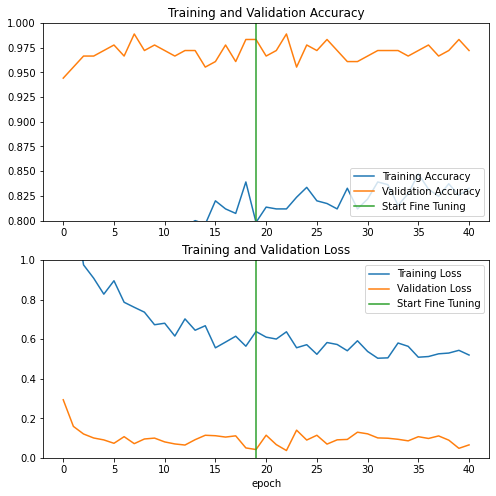

In [93]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()



In [94]:
loss, accuracy = model.evaluate(test_set)
print('Test accuracy :', accuracy)

1/1 [==============================] - 2s 2s/step - loss: 0.0094 - accuracy: 1.0000
Test accuracy : 1.0


In [95]:
del model
del base_model
del history
del loss0, accuracy0
del accuracy

gc.collect()

90049


5) Transfer Learning with EfficientNet
Implementation

In [96]:
rescale = layers.Rescaling(1./255, offset=-1)
preprocess_input = keras.applications.efficientnet.preprocess_input
base_model = keras.applications.efficientnet.EfficientNetB7(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

In [97]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)

In [98]:
val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [99]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

Number of validation batches: 5
Number of test batches: 1


In [100]:
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 2560)


In [101]:
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 8)


In [102]:
for layer in base_model.layers[:10]:
  base_model.trainable = False

In [103]:
base_model.summary()

Model: "efficientnetb7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_5 (Rescaling)        (None, 224, 224, 3)  0           ['input_9[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling_5[0][0]']            
                                                                                                  
 tf.math.truediv_2 (TFOpLambda)  (None, 224, 224, 3)  0          ['normalization[0][0

 block1c_dwconv (DepthwiseConv2  (None, 112, 112, 32  288        ['block1b_add[0][0]']            
 D)                             )                                                                 
                                                                                                  
 block1c_bn (BatchNormalization  (None, 112, 112, 32  128        ['block1c_dwconv[0][0]']         
 )                              )                                                                 
                                                                                                  
 block1c_activation (Activation  (None, 112, 112, 32  0          ['block1c_bn[0][0]']             
 )                              )                                                                 
                                                                                                  
 block1c_se_squeeze (GlobalAver  (None, 32)          0           ['block1c_activation[0][0]']     
 agePoolin

                                                                                                  
 block2a_activation (Activation  (None, 56, 56, 192)  0          ['block2a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block2a_se_squeeze (GlobalAver  (None, 192)         0           ['block2a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block2a_se_reshape (Reshape)   (None, 1, 1, 192)    0           ['block2a_se_squeeze[0][0]']     
                                                                                                  
 block2a_se_reduce (Conv2D)     (None, 1, 1, 8)      1544        ['block2a_se_reshape[0][0]']     
          

                                                                                                  
 block2c_se_expand (Conv2D)     (None, 1, 1, 288)    3744        ['block2c_se_reduce[0][0]']      
                                                                                                  
 block2c_se_excite (Multiply)   (None, 56, 56, 288)  0           ['block2c_activation[0][0]',     
                                                                  'block2c_se_expand[0][0]']      
                                                                                                  
 block2c_project_conv (Conv2D)  (None, 56, 56, 48)   13824       ['block2c_se_excite[0][0]']      
                                                                                                  
 block2c_project_bn (BatchNorma  (None, 56, 56, 48)  192         ['block2c_project_conv[0][0]']   
 lization)                                                                                        
          

                                                                                                  
 block2e_project_conv (Conv2D)  (None, 56, 56, 48)   13824       ['block2e_se_excite[0][0]']      
                                                                                                  
 block2e_project_bn (BatchNorma  (None, 56, 56, 48)  192         ['block2e_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block2e_drop (Dropout)         (None, 56, 56, 48)   0           ['block2e_project_bn[0][0]']     
                                                                                                  
 block2e_add (Add)              (None, 56, 56, 48)   0           ['block2e_drop[0][0]',           
                                                                  'block2d_add[0][0]']            
          

                                                                                                  
 block2g_drop (Dropout)         (None, 56, 56, 48)   0           ['block2g_project_bn[0][0]']     
                                                                                                  
 block2g_add (Add)              (None, 56, 56, 48)   0           ['block2g_drop[0][0]',           
                                                                  'block2f_add[0][0]']            
                                                                                                  
 block3a_expand_conv (Conv2D)   (None, 56, 56, 288)  13824       ['block2g_add[0][0]']            
                                                                                                  
 block3a_expand_bn (BatchNormal  (None, 56, 56, 288)  1152       ['block3a_expand_conv[0][0]']    
 ization)                                                                                         
          

                                                                                                  
 block3c_expand_bn (BatchNormal  (None, 28, 28, 480)  1920       ['block3c_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block3c_expand_activation (Act  (None, 28, 28, 480)  0          ['block3c_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block3c_dwconv (DepthwiseConv2  (None, 28, 28, 480)  12000      ['block3c_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block3c_b

 ivation)                                                                                         
                                                                                                  
 block3e_dwconv (DepthwiseConv2  (None, 28, 28, 480)  12000      ['block3e_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block3e_bn (BatchNormalization  (None, 28, 28, 480)  1920       ['block3e_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block3e_activation (Activation  (None, 28, 28, 480)  0          ['block3e_bn[0][0]']             
 )                                                                                                
          

 block3g_bn (BatchNormalization  (None, 28, 28, 480)  1920       ['block3g_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block3g_activation (Activation  (None, 28, 28, 480)  0          ['block3g_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block3g_se_squeeze (GlobalAver  (None, 480)         0           ['block3g_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block3g_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block3g_se_squeeze[0][0]']     
          

 agePooling2D)                                                                                    
                                                                                                  
 block4b_se_reshape (Reshape)   (None, 1, 1, 960)    0           ['block4b_se_squeeze[0][0]']     
                                                                                                  
 block4b_se_reduce (Conv2D)     (None, 1, 1, 40)     38440       ['block4b_se_reshape[0][0]']     
                                                                                                  
 block4b_se_expand (Conv2D)     (None, 1, 1, 960)    39360       ['block4b_se_reduce[0][0]']      
                                                                                                  
 block4b_se_excite (Multiply)   (None, 14, 14, 960)  0           ['block4b_activation[0][0]',     
                                                                  'block4b_se_expand[0][0]']      
          

                                                                                                  
 block4d_se_expand (Conv2D)     (None, 1, 1, 960)    39360       ['block4d_se_reduce[0][0]']      
                                                                                                  
 block4d_se_excite (Multiply)   (None, 14, 14, 960)  0           ['block4d_activation[0][0]',     
                                                                  'block4d_se_expand[0][0]']      
                                                                                                  
 block4d_project_conv (Conv2D)  (None, 14, 14, 160)  153600      ['block4d_se_excite[0][0]']      
                                                                                                  
 block4d_project_bn (BatchNorma  (None, 14, 14, 160)  640        ['block4d_project_conv[0][0]']   
 lization)                                                                                        
          

                                                                                                  
 block4f_project_conv (Conv2D)  (None, 14, 14, 160)  153600      ['block4f_se_excite[0][0]']      
                                                                                                  
 block4f_project_bn (BatchNorma  (None, 14, 14, 160)  640        ['block4f_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block4f_drop (Dropout)         (None, 14, 14, 160)  0           ['block4f_project_bn[0][0]']     
                                                                                                  
 block4f_add (Add)              (None, 14, 14, 160)  0           ['block4f_drop[0][0]',           
                                                                  'block4e_add[0][0]']            
          

                                                                                                  
 block4h_drop (Dropout)         (None, 14, 14, 160)  0           ['block4h_project_bn[0][0]']     
                                                                                                  
 block4h_add (Add)              (None, 14, 14, 160)  0           ['block4h_drop[0][0]',           
                                                                  'block4g_add[0][0]']            
                                                                                                  
 block4i_expand_conv (Conv2D)   (None, 14, 14, 960)  153600      ['block4h_add[0][0]']            
                                                                                                  
 block4i_expand_bn (BatchNormal  (None, 14, 14, 960)  3840       ['block4i_expand_conv[0][0]']    
 ization)                                                                                         
          

                                                                                                  
 block5a_expand_conv (Conv2D)   (None, 14, 14, 960)  153600      ['block4j_add[0][0]']            
                                                                                                  
 block5a_expand_bn (BatchNormal  (None, 14, 14, 960)  3840       ['block5a_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block5a_expand_activation (Act  (None, 14, 14, 960)  0          ['block5a_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block5a_dwconv (DepthwiseConv2  (None, 14, 14, 960)  24000      ['block5a_expand_activation[0][0]
 D)       

                                                                                                  
 block5c_dwconv (DepthwiseConv2  (None, 14, 14, 1344  33600      ['block5c_expand_activation[0][0]
 D)                             )                                ']                               
                                                                                                  
 block5c_bn (BatchNormalization  (None, 14, 14, 1344  5376       ['block5c_dwconv[0][0]']         
 )                              )                                                                 
                                                                                                  
 block5c_activation (Activation  (None, 14, 14, 1344  0          ['block5c_bn[0][0]']             
 )                              )                                                                 
                                                                                                  
 block5c_s

                                                                                                  
 block5e_bn (BatchNormalization  (None, 14, 14, 1344  5376       ['block5e_dwconv[0][0]']         
 )                              )                                                                 
                                                                                                  
 block5e_activation (Activation  (None, 14, 14, 1344  0          ['block5e_bn[0][0]']             
 )                              )                                                                 
                                                                                                  
 block5e_se_squeeze (GlobalAver  (None, 1344)        0           ['block5e_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5e_s

                                                                                                  
 block5g_activation (Activation  (None, 14, 14, 1344  0          ['block5g_bn[0][0]']             
 )                              )                                                                 
                                                                                                  
 block5g_se_squeeze (GlobalAver  (None, 1344)        0           ['block5g_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5g_se_reshape (Reshape)   (None, 1, 1, 1344)   0           ['block5g_se_squeeze[0][0]']     
                                                                                                  
 block5g_se_reduce (Conv2D)     (None, 1, 1, 56)     75320       ['block5g_se_reshape[0][0]']     
          

                                                                                                  
 block5i_se_squeeze (GlobalAver  (None, 1344)        0           ['block5i_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5i_se_reshape (Reshape)   (None, 1, 1, 1344)   0           ['block5i_se_squeeze[0][0]']     
                                                                                                  
 block5i_se_reduce (Conv2D)     (None, 1, 1, 56)     75320       ['block5i_se_reshape[0][0]']     
                                                                                                  
 block5i_se_expand (Conv2D)     (None, 1, 1, 1344)   76608       ['block5i_se_reduce[0][0]']      
                                                                                                  
 block5i_s

                                                                                                  
 block6a_se_squeeze (GlobalAver  (None, 1344)        0           ['block6a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block6a_se_reshape (Reshape)   (None, 1, 1, 1344)   0           ['block6a_se_squeeze[0][0]']     
                                                                                                  
 block6a_se_reduce (Conv2D)     (None, 1, 1, 56)     75320       ['block6a_se_reshape[0][0]']     
                                                                                                  
 block6a_se_expand (Conv2D)     (None, 1, 1, 1344)   76608       ['block6a_se_reduce[0][0]']      
                                                                                                  
 block6a_s

 block6c_se_excite (Multiply)   (None, 7, 7, 2304)   0           ['block6c_activation[0][0]',     
                                                                  'block6c_se_expand[0][0]']      
                                                                                                  
 block6c_project_conv (Conv2D)  (None, 7, 7, 384)    884736      ['block6c_se_excite[0][0]']      
                                                                                                  
 block6c_project_bn (BatchNorma  (None, 7, 7, 384)   1536        ['block6c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6c_drop (Dropout)         (None, 7, 7, 384)    0           ['block6c_project_bn[0][0]']     
                                                                                                  
 block6c_a

 block6e_project_bn (BatchNorma  (None, 7, 7, 384)   1536        ['block6e_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6e_drop (Dropout)         (None, 7, 7, 384)    0           ['block6e_project_bn[0][0]']     
                                                                                                  
 block6e_add (Add)              (None, 7, 7, 384)    0           ['block6e_drop[0][0]',           
                                                                  'block6d_add[0][0]']            
                                                                                                  
 block6f_expand_conv (Conv2D)   (None, 7, 7, 2304)   884736      ['block6e_add[0][0]']            
                                                                                                  
 block6f_e

 block6g_add (Add)              (None, 7, 7, 384)    0           ['block6g_drop[0][0]',           
                                                                  'block6f_add[0][0]']            
                                                                                                  
 block6h_expand_conv (Conv2D)   (None, 7, 7, 2304)   884736      ['block6g_add[0][0]']            
                                                                                                  
 block6h_expand_bn (BatchNormal  (None, 7, 7, 2304)  9216        ['block6h_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6h_expand_activation (Act  (None, 7, 7, 2304)  0           ['block6h_expand_bn[0][0]']      
 ivation)                                                                                         
          

 block6j_expand_bn (BatchNormal  (None, 7, 7, 2304)  9216        ['block6j_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6j_expand_activation (Act  (None, 7, 7, 2304)  0           ['block6j_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block6j_dwconv (DepthwiseConv2  (None, 7, 7, 2304)  57600       ['block6j_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block6j_bn (BatchNormalization  (None, 7, 7, 2304)  9216        ['block6j_dwconv[0][0]']         
 )        

                                                                                                  
 block6l_dwconv (DepthwiseConv2  (None, 7, 7, 2304)  57600       ['block6l_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block6l_bn (BatchNormalization  (None, 7, 7, 2304)  9216        ['block6l_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block6l_activation (Activation  (None, 7, 7, 2304)  0           ['block6l_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block6l_s

 )                                                                                                
                                                                                                  
 block7a_activation (Activation  (None, 7, 7, 2304)  0           ['block7a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block7a_se_squeeze (GlobalAver  (None, 2304)        0           ['block7a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block7a_se_reshape (Reshape)   (None, 1, 1, 2304)   0           ['block7a_se_squeeze[0][0]']     
                                                                                                  
 block7a_s

 block7c_se_reduce (Conv2D)     (None, 1, 1, 160)    614560      ['block7c_se_reshape[0][0]']     
                                                                                                  
 block7c_se_expand (Conv2D)     (None, 1, 1, 3840)   618240      ['block7c_se_reduce[0][0]']      
                                                                                                  
 block7c_se_excite (Multiply)   (None, 7, 7, 3840)   0           ['block7c_activation[0][0]',     
                                                                  'block7c_se_expand[0][0]']      
                                                                                                  
 block7c_project_conv (Conv2D)  (None, 7, 7, 640)    2457600     ['block7c_se_excite[0][0]']      
                                                                                                  
 block7c_project_bn (BatchNorma  (None, 7, 7, 640)   2560        ['block7c_project_conv[0][0]']   
 lization)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.363896 to fit



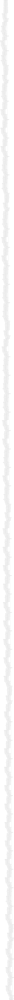

In [104]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [105]:
inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.7)(x)
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [106]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [107]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
35/35 [==============================] - 390s 10s/step - loss: 1.2564 - accuracy: 0.6391 - val_loss: 0.3742 - val_accuracy: 0.9456
Epoch 2/20
35/35 [==============================] - 278s 8s/step - loss: 0.5368 - accuracy: 0.8573 - val_loss: 0.1955 - val_accuracy: 0.9592
Epoch 3/20
35/35 [==============================] - 282s 8s/step - loss: 0.4133 - accuracy: 0.8809 - val_loss: 0.1642 - val_accuracy: 0.9592
Epoch 4/20
35/35 [==============================] - 280s 8s/step - loss: 0.3499 - accuracy: 0.8891 - val_loss: 0.1082 - val_accuracy: 0.9660
Epoch 5/20
35/35 [==============================] - 277s 8s/step - loss: 0.3346 - accuracy: 0.8927 - val_loss: 0.1040 - val_accuracy: 0.9864
Epoch 6/20
35/35 [==============================] - 281s 8s/step - loss: 0.3034 - accuracy: 0.8973 - val_loss: 0.0917 - val_accuracy: 0.9728
Epoch 7/20
35/35 [==============================] - 283s 8s/step - loss: 0.2909 - accuracy: 0.9000 - val_loss: 0.1195 - val_accuracy: 0.9592
Epoch 8/20
3

In [108]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

5/5 [==============================] - 33s 6s/step - loss: 0.1117 - accuracy: 0.9660
initial loss: 0.11
initial accuracy: 0.97


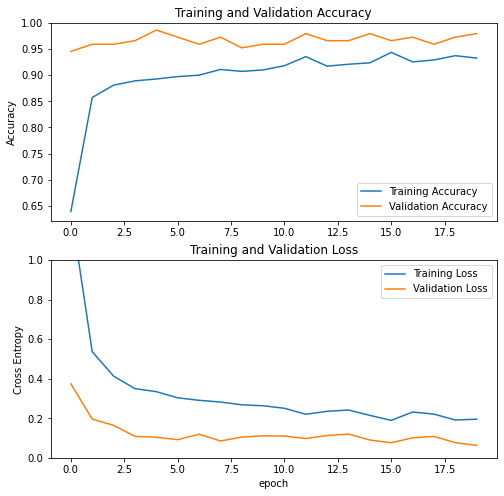

In [109]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Fine-tune

In [110]:
base_model.trainable = True

In [111]:
# Fine-tune from this layer onwards
fine_tune_at = 10

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [112]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)


print("Done in %0.3fs." % (time() - t0))

Epoch 20/40
35/35 [==============================] - 287s 8s/step - loss: 0.1852 - accuracy: 0.9409 - val_loss: 0.1114 - val_accuracy: 0.9660
Epoch 21/40
35/35 [==============================] - 288s 8s/step - loss: 0.1989 - accuracy: 0.9291 - val_loss: 0.1136 - val_accuracy: 0.9660
Epoch 22/40
35/35 [==============================] - 287s 8s/step - loss: 0.1735 - accuracy: 0.9409 - val_loss: 0.0953 - val_accuracy: 0.9864
Epoch 23/40
35/35 [==============================] - 287s 8s/step - loss: 0.1921 - accuracy: 0.9309 - val_loss: 0.0797 - val_accuracy: 0.9660
Epoch 24/40
35/35 [==============================] - 292s 8s/step - loss: 0.1784 - accuracy: 0.9427 - val_loss: 0.1047 - val_accuracy: 0.9592
Epoch 25/40
35/35 [==============================] - 290s 8s/step - loss: 0.1700 - accuracy: 0.9500 - val_loss: 0.1215 - val_accuracy: 0.9592
Epoch 26/40
35/35 [==============================] - 292s 8s/step - loss: 0.1748 - accuracy: 0.9409 - val_loss: 0.1242 - val_accuracy: 0.9592
Epoch 

In [113]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

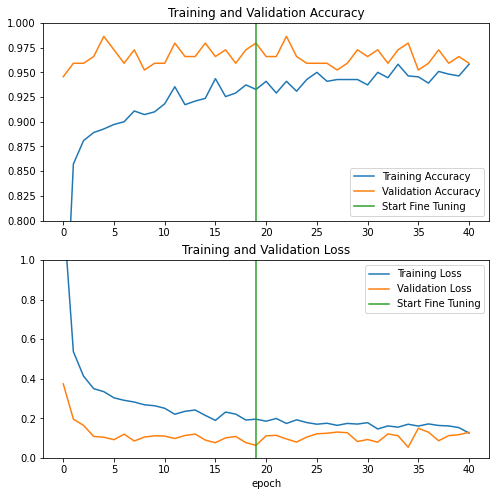

In [114]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [115]:
loss, accuracy = model.evaluate(test_set)
print('Test accuracy :', accuracy)

1/1 [==============================] - 7s 7s/step - loss: 0.2574 - accuracy: 0.9375
Test accuracy : 0.9375


In [116]:
del loss, accuracy
del model
del base_model
del history
del train_set
del test_set
del val_set

gc.collect()

124911


Generalization with 120 breeds
1) Data augmentation & preprocessing

In [117]:
path = 'C:/Users/dupon/OneDrive/Bureau/OCR/Machine Learning/Projet 6/Images/'
img_width, img_height = 224, 224
channels = 3
batch_size = 32
image_arr_size= img_width * img_height * channels

In [118]:
# Creating a train set
train_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="training",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 20580 files belonging to 120 classes.
Using 16464 files for training.


In [119]:
# Creating a validation set
val_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 20580 files belonging to 120 classes.
Using 4116 files for validation.


In [120]:
# Displaying names of breed
class_names = val_set.class_names
print(class_names)

['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02094258-Norwich_terrier', 'n02094433-Yorkshire_t

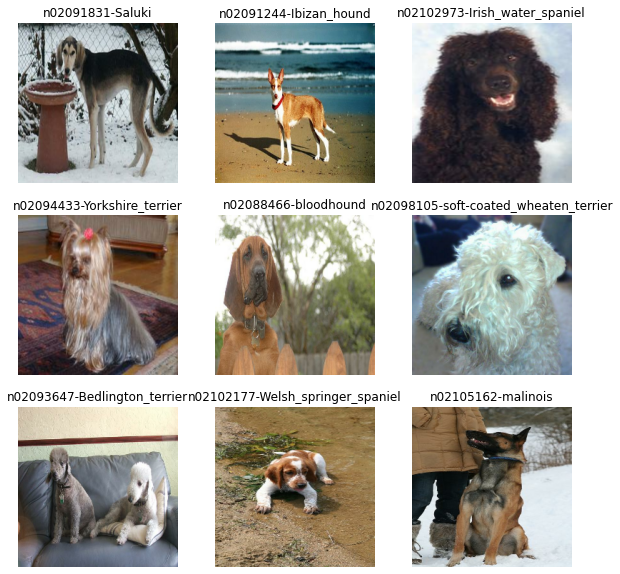

In [121]:
# Displaying some pictures of train set
plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [122]:
val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [123]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

Number of validation batches: 104
Number of test batches: 25


In [124]:
AUTOTUNE = tf.data.AUTOTUNE

train_set = train_set.prefetch(buffer_size=AUTOTUNE)
val_set = val_set.prefetch(buffer_size=AUTOTUNE)
test_set = test_set.prefetch(buffer_size=AUTOTUNE)

In [125]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip('horizontal_and_vertical', seed=42),
  layers.RandomRotation(0.2, seed=42),
  layers.RandomContrast(0.7, seed=42),
  layers.RandomTranslation(height_factor=(-0.2, 0.3),
                           width_factor=(-0.2, 0.3),
                           fill_mode='reflect', seed=42)
])

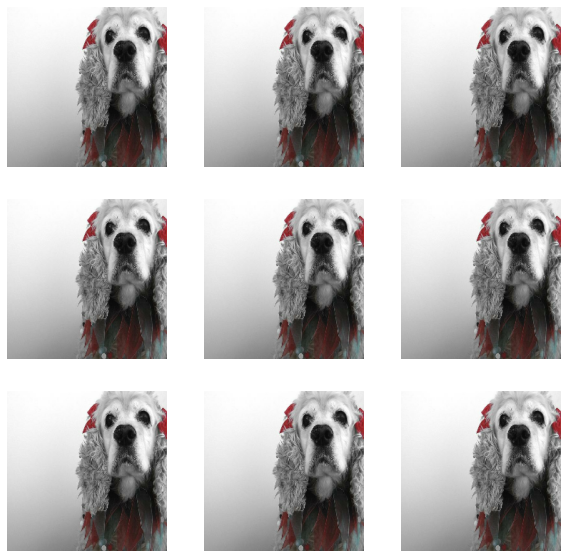

In [126]:
for image, _ in train_set.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

Modelisation avec inception V3

In [127]:
img_shape = img_height, img_width, channels
num_classes = 120

In [128]:
rescale = layers.Rescaling(1./255, offset=-1)

In [129]:
preprocess_input = keras.applications.inception_v3.preprocess_input
base_model = keras.applications.inception_v3.InceptionV3(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

In [130]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 2048)


In [131]:
num_classes=120
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 120)


In [132]:
for layer in base_model.layers[:15]:
  base_model.trainable = False

In [133]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_100 (Conv2D)            (None, 111, 111, 32  864         ['input_11[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 111, 111, 32  96         ['conv2d_100[0][0]']             
 ormalization)                  )                                                      

 conv2d_111 (Conv2D)            (None, 25, 25, 32)   6144        ['average_pooling2d_9[0][0]']    
                                                                                                  
 batch_normalization_99 (BatchN  (None, 25, 25, 64)  192         ['conv2d_105[0][0]']             
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_101 (Batch  (None, 25, 25, 64)  192         ['conv2d_107[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_104 (Batch  (None, 25, 25, 96)  288         ['conv2d_110[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 conv2d_122 (Conv2D)            (None, 25, 25, 64)   18432       ['mixed1[0][0]']                 
                                                                                                  
 batch_normalization_116 (Batch  (None, 25, 25, 64)  192         ['conv2d_122[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_116 (Activation)    (None, 25, 25, 64)   0           ['batch_normalization_116[0][0]']
                                                                                                  
 conv2d_120 (Conv2D)            (None, 25, 25, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_12

                                                                                                  
 activation_123 (Activation)    (None, 12, 12, 96)   0           ['batch_normalization_123[0][0]']
                                                                                                  
 max_pooling2d_15 (MaxPooling2D  (None, 12, 12, 288)  0          ['mixed2[0][0]']                 
 )                                                                                                
                                                                                                  
 mixed3 (Concatenate)           (None, 12, 12, 768)  0           ['activation_120[0][0]',         
                                                                  'activation_123[0][0]',         
                                                                  'max_pooling2d_15[0][0]']       
                                                                                                  
 conv2d_13

 mixed4 (Concatenate)           (None, 12, 12, 768)  0           ['activation_124[0][0]',         
                                                                  'activation_127[0][0]',         
                                                                  'activation_132[0][0]',         
                                                                  'activation_133[0][0]']         
                                                                                                  
 conv2d_144 (Conv2D)            (None, 12, 12, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_138 (Batch  (None, 12, 12, 160)  480        ['conv2d_144[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activatio

 conv2d_154 (Conv2D)            (None, 12, 12, 160)  122880      ['mixed5[0][0]']                 
                                                                                                  
 batch_normalization_148 (Batch  (None, 12, 12, 160)  480        ['conv2d_154[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_148 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_148[0][0]']
                                                                                                  
 conv2d_155 (Conv2D)            (None, 12, 12, 160)  179200      ['activation_148[0][0]']         
                                                                                                  
 batch_normalization_149 (Batch  (None, 12, 12, 160)  480        ['conv2d_155[0][0]']             
 Normaliza

 activation_158 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_158[0][0]']
                                                                                                  
 conv2d_165 (Conv2D)            (None, 12, 12, 192)  258048      ['activation_158[0][0]']         
                                                                                                  
 batch_normalization_159 (Batch  (None, 12, 12, 192)  576        ['conv2d_165[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_159 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_159[0][0]']
                                                                                                  
 conv2d_161 (Conv2D)            (None, 12, 12, 192)  147456      ['mixed6[0][0]']                 
          

 Normalization)                                                                                   
                                                                                                  
 activation_167 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_167[0][0]']
                                                                                                  
 conv2d_170 (Conv2D)            (None, 12, 12, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_174 (Conv2D)            (None, 12, 12, 192)  258048      ['activation_167[0][0]']         
                                                                                                  
 batch_normalization_164 (Batch  (None, 12, 12, 192)  576        ['conv2d_170[0][0]']             
 Normalization)                                                                                   
          

 Normalization)                                                                                   
                                                                                                  
 conv2d_184 (Conv2D)            (None, 5, 5, 192)    245760      ['average_pooling2d_16[0][0]']   
                                                                                                  
 batch_normalization_170 (Batch  (None, 5, 5, 320)   960         ['conv2d_176[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_172 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_172[0][0]']
                                                                                                  
 activation_173 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_173[0][0]']
          

                                                                                                  
 activation_181 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_181[0][0]']
                                                                                                  
 activation_182 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_182[0][0]']
                                                                                                  
 activation_185 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_185[0][0]']
                                                                                                  
 activation_186 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_186[0][0]']
                                                                                                  
 batch_normalization_187 (Batch  (None, 5, 5, 192)   576         ['conv2d_193[0][0]']             
 Normaliza

In [134]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [135]:
inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.7)(x)
x = layers.Flatten()(x)
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [136]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [137]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)


print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
515/515 [==============================] - 1413s 3s/step - loss: 4.5978 - accuracy: 0.1748 - val_loss: 0.8278 - val_accuracy: 0.7539
Epoch 2/20
515/515 [==============================] - 1374s 3s/step - loss: 3.7493 - accuracy: 0.2853 - val_loss: 0.7073 - val_accuracy: 0.7928
Epoch 3/20
515/515 [==============================] - 1407s 3s/step - loss: 3.6393 - accuracy: 0.3155 - val_loss: 0.6938 - val_accuracy: 0.7910
Epoch 4/20
515/515 [==============================] - 1403s 3s/step - loss: 3.6219 - accuracy: 0.3217 - val_loss: 0.6812 - val_accuracy: 0.8001
Epoch 5/20
515/515 [==============================] - 1369s 3s/step - loss: 3.6170 - accuracy: 0.3240 - val_loss: 0.6870 - val_accuracy: 0.7964
Epoch 6/20
515/515 [==============================] - 1284s 2s/step - loss: 3.6249 - accuracy: 0.3418 - val_loss: 0.7292 - val_accuracy: 0.7892
Epoch 7/20
515/515 [==============================] - 1278s 2s/step - loss: 3.6334 - accuracy: 0.3372 - val_loss: 0.7129 - val_accuracy:

In [138]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

104/104 [==============================] - 198s 2s/step - loss: 0.7411 - accuracy: 0.7989
initial loss: 0.74
initial accuracy: 0.80


Accuracy and loss

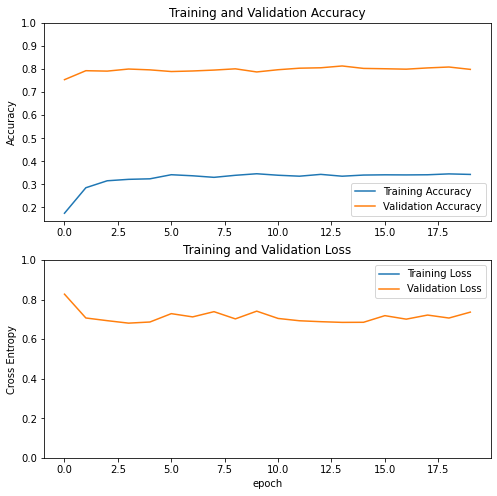

In [139]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Fine-tuning

In [140]:
base_model.trainable = True

In [141]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 25

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

Number of layers in the base model:  311


In [142]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)

print("Done in %0.3fs." % (time() - t0))

Epoch 20/40
515/515 [==============================] - 1229s 2s/step - loss: 3.8018 - accuracy: 0.3477 - val_loss: 0.7239 - val_accuracy: 0.8046
Epoch 21/40
515/515 [==============================] - 1238s 2s/step - loss: 3.8171 - accuracy: 0.3488 - val_loss: 0.7071 - val_accuracy: 0.8031
Epoch 22/40
515/515 [==============================] - 1232s 2s/step - loss: 3.8193 - accuracy: 0.3442 - val_loss: 0.6952 - val_accuracy: 0.8049
Epoch 23/40
515/515 [==============================] - 39492s 77s/step - loss: 3.8637 - accuracy: 0.3443 - val_loss: 0.7238 - val_accuracy: 0.8037
Epoch 24/40
515/515 [==============================] - 1242s 2s/step - loss: 3.8455 - accuracy: 0.3452 - val_loss: 0.7161 - val_accuracy: 0.8064
Epoch 25/40
515/515 [==============================] - 1237s 2s/step - loss: 3.8071 - accuracy: 0.3513 - val_loss: 0.7246 - val_accuracy: 0.8070
Epoch 26/40
515/515 [==============================] - 1272s 2s/step - loss: 3.8239 - accuracy: 0.3486 - val_loss: 0.7059 - val_

In [143]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

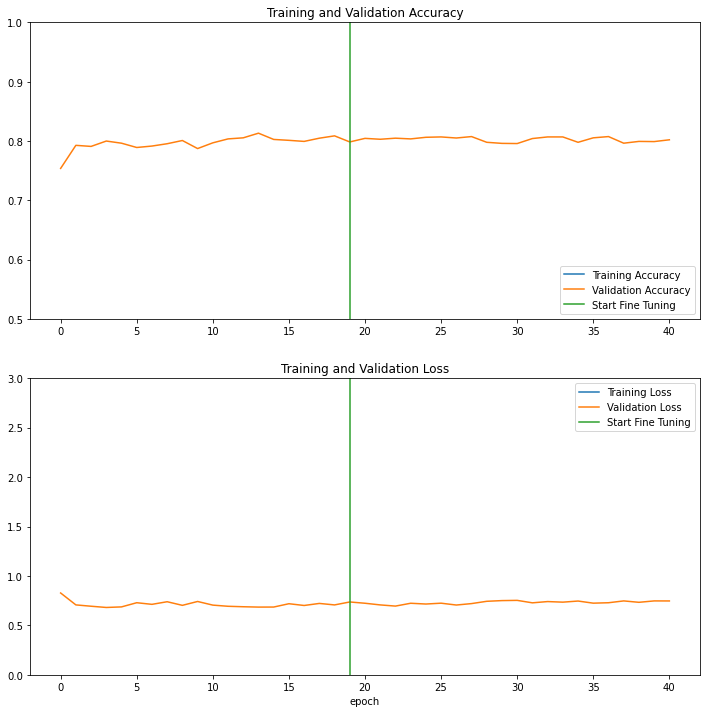

In [144]:
plt.figure(figsize=(12, 12))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.5, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 3.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [145]:
loss, accuracy = model.evaluate(test_set)

25/25 [==============================] - 51s 2s/step - loss: 0.7748 - accuracy: 0.7825


Evaluation perf

In [146]:
print('Test accuracy :', round(accuracy, 3))

Test accuracy : 0.783


In [147]:
preds = model.predict(test_set, verbose = 1)

25/25 [==============================] - 52s 2s/step


In [148]:
pred_labels = tf.argmax(preds, axis=1)

In [149]:
test_labels = np.concatenate([y for x, y in test_set], axis=0)

In [150]:
from sklearn.metrics import classification_report

report = classification_report(test_labels, pred_labels, output_dict=True)

In [151]:
f1scores = {}
for k,v in report.items():
    if k == 'accuracy':
        break
    else:
        f1scores[class_names[int(k)]] = v['f1-score']

In [152]:
F1 = pd.DataFrame({"Classes":list(f1scores.keys()),
                   "F1-Scores":list(f1scores.values())}).sort_values("F1-Scores", ascending=False)

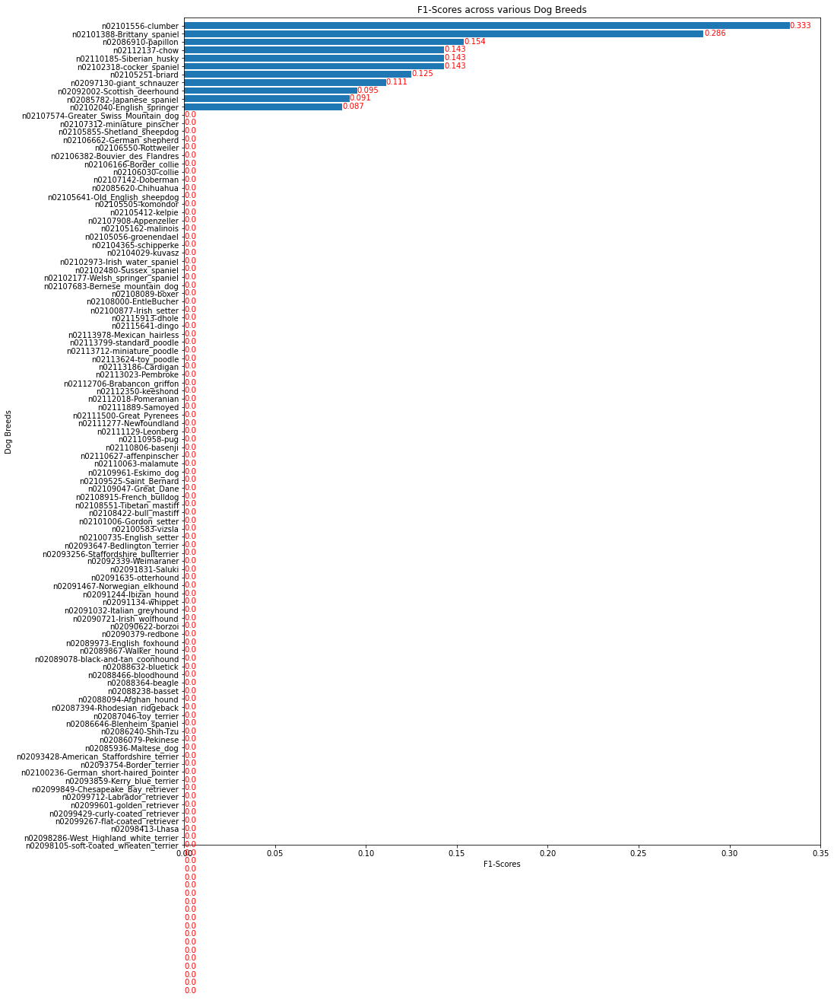

In [153]:
fig, ax = plt.subplots(figsize = (15,20))
plt.barh(F1["Classes"], F1["F1-Scores"])
plt.ylim(-1,101)
plt.xlabel("F1-Scores")
plt.ylabel("Dog Breeds")
plt.title("F1-Scores across various Dog Breeds")
plt.gca().invert_yaxis()
for i, v in enumerate(round(F1["F1-Scores"],3)):
    ax.text(v, i + .25, str(v), color='red')

In [154]:
model.save("C:/Users/dupon/OneDrive/Bureau/OCR/Machine Learning/Projet 6/my_model.h5")

new predict

In [155]:
with open("C:/Users/dupon/OneDrive/Bureau/OCR/Machine Learning/Projet 6/dogs_name.txt", "w") as output:
    output.write(str(class_names))

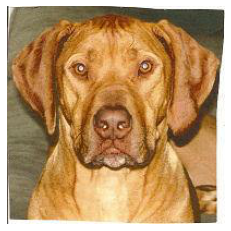

In [156]:
from tensorflow.keras.utils import load_img, img_to_array

path_test = "C:/Users/dupon/OneDrive/Bureau/OCR/Machine Learning/Projet 6/Images/n02087394-Rhodesian_ridgeback/n02087394_381.jpg"
test = load_img(path_test)

plt.axis("off")
plt.imshow(test)

In [157]:
import cv2

img_test = img_to_array(test)
img_test = cv2.resize(img_test,(224,224))
img_test = img_test.reshape(1,224,224,3)
predictions = model.predict(img_test)
pred = tf.nn.softmax(predictions[0])
print("This image belongs to {}.".format(class_names[np.argmax(pred)]))

1/1 [==============================] - 1s 1s/step
This image belongs to n02087394-Rhodesian_ridgeback.
